In [1]:
import pandas as pd
import numpy as np
import missingno as msno
from IPython.display import display, HTML
display(HTML("<style>.container { width:70% !important; }</style>"))
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
pd.set_option('display.max_columns', None)
import math
import warnings
warnings.filterwarnings("ignore")

import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
import plotly.io as pio
# pio.renderers.default = 'notebook'
pio.renderers.default = "notebook_connected"

# helper functions

In [2]:
def plot_hist_stacked(df1, feature, title):
    
    df = df1.copy()

    df['Fraud Status'] = df['fraud_bool'].map({1: 'Fraud', 0: 'Non-Fraud'})

    fig = px.histogram(df, x=feature, color='Fraud Status',
                       barmode='overlay',  # Overlays the fraud and non-fraud histograms
                       nbins=50,  
                       color_discrete_map={'Fraud':'red', 'Non-Fraud':'green'}, 
                       labels={'Fraud Status':'Fraud Status', feature: feature},  
                       opacity=0.5,  
                       title=title) 

    fig.update_layout(xaxis_title=feature, yaxis_title='Count', legend_title='Fraud Status',
                      width=1800, height=800)  
    fig.show()

    try :
        df['{}_bin'.format(feature)] = pd.cut(df['{}'.format(feature)], bins=50)

        # Calculate the percentage distribution of Fraud Status within each credit_risk_score bin
        distribution = df.groupby(['{}_bin'.format(feature), 'Fraud Status']).size().unstack(fill_value=0)
        distribution_percentage = distribution.div(distribution.sum(axis=1), axis=0) * 100

        distribution_percentage.plot(kind='bar', stacked=True, figsize=(25, 10), color=['red', 'green'])

        plt.axhline(y=distribution_percentage['Fraud'].mean()) 
        plt.axhline(y=50, color='yellow') 

        plt.title(title)
        plt.xlabel('{}_bin'.format(feature))
        plt.ylabel('Percentage')
        plt.legend(title='Fraud Status')
        plt.xticks(rotation=75)

        plt.tight_layout
    except TypeError:
        print('cannot print stacked bar chart as cannot bin')

In [3]:
def plot_fraud_nonfraud(df):

    n_cols = len(df.columns) - 1
    cols_per_row = 4
    rows = math.ceil(n_cols / cols_per_row)

    fig, axs = plt.subplots(rows, cols_per_row, figsize=(20, 10 * rows), constrained_layout=True)

    # Flatten the axes array for easy indexing
    axs = axs.flatten()

    for i, feature in enumerate(df.columns.drop('fraud_bool')):
        # Separate the data by fraud_bool status
        data_fraud = df[df['fraud_bool'] == 1][feature].dropna()
        data_non_fraud = df[df['fraud_bool'] == 0][feature].dropna()

        # Create histograms for each category within the same subplot
        axs[i].hist(data_non_fraud, bins=50, alpha=0.5, label='Non-Fraud', color='green')
        axs[i].hist(data_fraud, bins=50, alpha=0.5, label='Fraud', color='red')

        # Set the title and legend for the subplot
        axs[i].set_title(feature)
        axs[i].legend()

    # Hide any unused subplots
    for j in range(i + 1, len(axs)):
        axs[j].set_visible(False)

    plt.tight_layout()
    plt.show()

In [4]:
def plot_distribution(df1):
    
    df = df1.copy()
    
    n_cols = len(df.columns) -1
    cols_per_row = 4
    rows = math.ceil(n_cols / cols_per_row)

    fig, axs = plt.subplots(rows, cols_per_row, figsize=(20, 10 * rows), constrained_layout=True)

    # Flatten the axes array for easy indexing
    axs = axs.flatten()

    for i, feature in enumerate(df.columns.drop('fraud_bool')):
        data = df[feature].dropna()

        # Create histograms for the feature
        axs[i].hist(data, bins=50, alpha=0.5, color='blue')

        # Set the title for the subplot
        axs[i].set_title(feature)
        

    # Hide any unused subplots
    for j in range(i + 1, len(axs)):
        axs[j].set_visible(False)

    plt.tight_layout()
    plt.show()

In [5]:
def plot_comparison(df1, df2):
    
    df = df1.copy()
    
    n_cols = len(df.columns) -1
    cols_per_row = 4
    rows = math.ceil(n_cols / cols_per_row)

    fig, axs = plt.subplots(rows, cols_per_row, figsize=(20, 10 * rows), constrained_layout=True)

    # Flatten the axes array for easy indexing
    axs = axs.flatten()

    for i, feature in enumerate(df.columns.drop('fraud_bool')):
        data = df[feature].dropna()
        axs[i].hist(data, bins=50, alpha=0.5,  label='filtered_df')
        axs[i].set_title(feature)
        
        data2 = df2[feature].dropna()
        axs[i].hist(data2, bins=50, alpha=0.5,  label='full_df')
        axs[i].set_title(feature)
        axs[i].legend()

    # Hide any unused subplots
    for j in range(i + 1, len(axs)):
        axs[j].set_visible(False)

    plt.tight_layout()
    plt.show()

In [6]:
df_cluster = pd.read_csv('kmeans_5_data.csv')
df_cluster.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46321 entries, 0 to 46320
Data columns (total 28 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   income                            46321 non-null  float64
 1   name_email_similarity             46321 non-null  float64
 2   current_address_months_count      46321 non-null  float64
 3   customer_age                      46321 non-null  float64
 4   days_since_request                46321 non-null  float64
 5   payment_type                      46321 non-null  object 
 6   zip_count_4w                      46321 non-null  float64
 7   bank_branch_count_8w              46321 non-null  float64
 8   date_of_birth_distinct_emails_4w  46321 non-null  float64
 9   employment_status                 46321 non-null  object 
 10  credit_risk_score                 46321 non-null  float64
 11  email_is_free                     46321 non-null  int64  
 12  hous

In [7]:
df_cluster.head()

,income,name_email_similarity,current_address_months_count,customer_age,days_since_request,payment_type,zip_count_4w,bank_branch_count_8w,date_of_birth_distinct_emails_4w,employment_status,credit_risk_score,email_is_free,housing_status,phone_home_valid,phone_mobile_valid,bank_months_count,have_bank_months_count,has_other_cards,proposed_credit_limit,foreign_request,device_os,device_distinct_emails_8w,bank_integration,income_credit_limit_ratio,have_prev_address,have_initial_bal,fraud_bool,kmeans_label
0,0.407406,0.723268,-0.522564,0.419661,-0.183534,AB,0.843486,-0.358920,0.362268,CB,-0.247503,0,BB,0,1,1.234325,0,0,-0.692942,0,other,-0.136122,0.809980,1.063210,0,0,1,0
1,-1.313236,-0.489086,1.126586,0.419661,-0.186603,AB,-0.175932,-0.323402,-1.419488,CA,1.647522,1,BA,0,0,1.560343,0,0,1.771900,0,windows,4.652686,1.060170,-1.157540,0,0,1,1
2,0.751535,-0.541423,-0.951794,1.219622,2.855117,AA,-0.006362,2.724548,-1.221515,CA,1.282053,1,BA,1,1,0.745299,1,0,1.771900,0,windows,-0.136122,0.434696,-0.893689,1,1,1,2
3,1.095663,-1.059615,-0.228879,2.019582,-0.188542,AC,-0.532030,-0.387779,-1.221515,CA,-0.166288,1,BA,0,1,1.152821,0,0,-0.692942,0,windows,4.652686,0.747433,1.722839,0,0,1,0
4,0.751535,-1.482508,-0.364426,0.419661,-0.188181,AC,1.303321,-0.387779,-0.033678,CA,1.349733,1,BC,0,1,-0.966292,0,0,-0.692942,0,other,-0.136122,-0.878800,1.393025,0,0,1,3


In [8]:
df_cluster[['kmeans_label', 'fraud_bool']].value_counts()

kmeans_label  fraud_bool
0             0             10079
3             0              9975
4             0              8731
1             0              6809
              1              3532
2             0              3007
3             1              1717
0             1              1393
4             1               663
2             1               415
dtype: int64

In [9]:
len(df_cluster[df_cluster['fraud_bool']==1])

7720

# all features

In [10]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    occurrences = df_cluster.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

In [11]:
df_cluster[df_cluster['fraud_bool']==1]['kmeans_label'].value_counts(normalize=True)

1    0.457513
3    0.222409
0    0.180440
4    0.085881
2    0.053756
Name: kmeans_label, dtype: float64

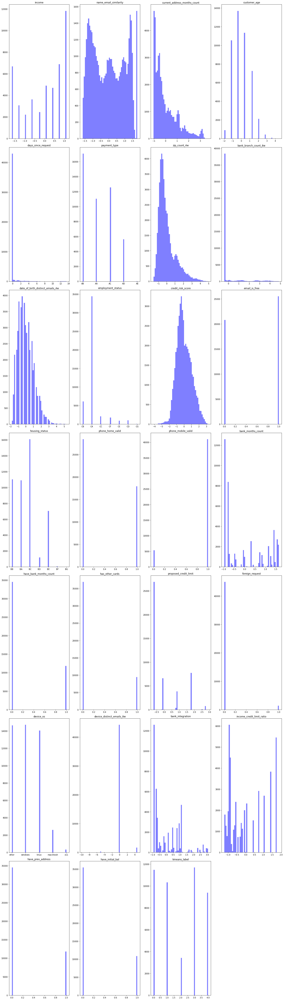

In [12]:
plot_distribution(df_cluster)

# cluster 1

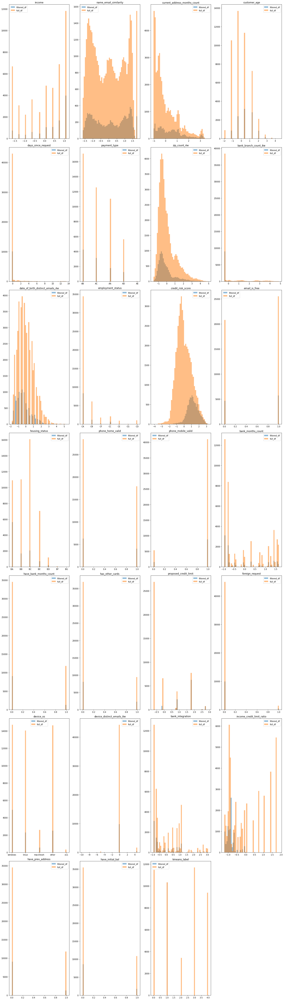

In [13]:
plot_comparison(df_cluster[df_cluster['kmeans_label']==1], df_cluster)

**Description**:
- credit_risk_score more left-skewed with a median of roughly 1
- bank integration mostly <1.25 and even bigger proportion below feature's mean
- income_credit_limit_ratio below mean
- the rest quite similar to full data

# current_address_months_count

In [14]:
occurrences = df_cluster.groupby(["kmeans_label", 'current_address_months_count', "fraud_bool"]).size().reset_index(name="Occurrences")
occurrences.sort_values("kmeans_label", inplace=True)
fig = px.scatter(occurrences, x='current_address_months_count', y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
fig.show()

## label=1

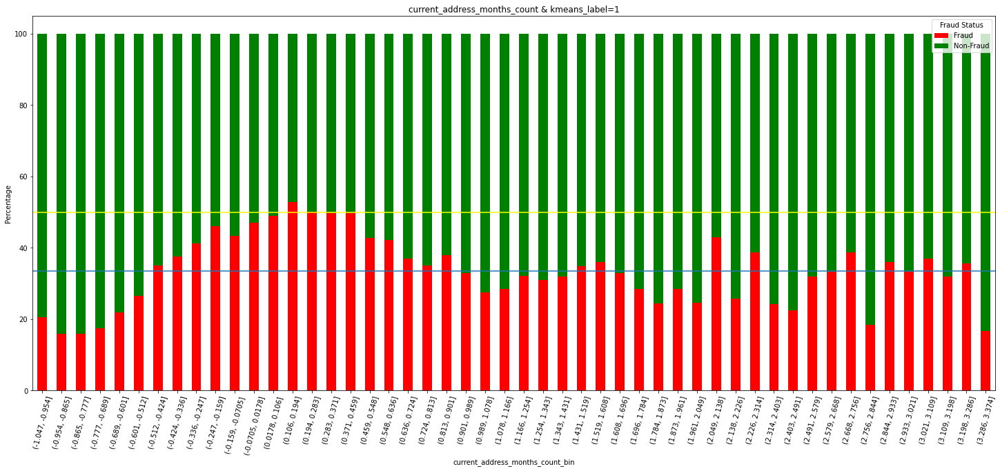

In [15]:
plot_hist_stacked(df_cluster[df_cluster['kmeans_label']==1], 'current_address_months_count', 'current_address_months_count & kmeans_label=1')

### current_address_months_count >= -0.512, label=1 (38%, 8k)

In [16]:
df_cluster[(df_cluster['kmeans_label']==1) & (df_cluster['current_address_months_count']>-0.512)]['fraud_bool'].value_counts()

0    4965
1    3077
Name: fraud_bool, dtype: int64

In [17]:
df_cluster[(df_cluster['kmeans_label']==1) & (df_cluster['current_address_months_count']>-0.512)]['fraud_bool'].value_counts(normalize=True)

0    0.617384
1    0.382616
Name: fraud_bool, dtype: float64

# date_of_birth_distinct_emails_4w

In [18]:
occurrences = df_cluster.groupby(["kmeans_label", 'date_of_birth_distinct_emails_4w', "fraud_bool"]).size().reset_index(name="Occurrences")
occurrences.sort_values("kmeans_label", inplace=True)
fig = px.scatter(occurrences, x='date_of_birth_distinct_emails_4w', y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
fig.show()

## all

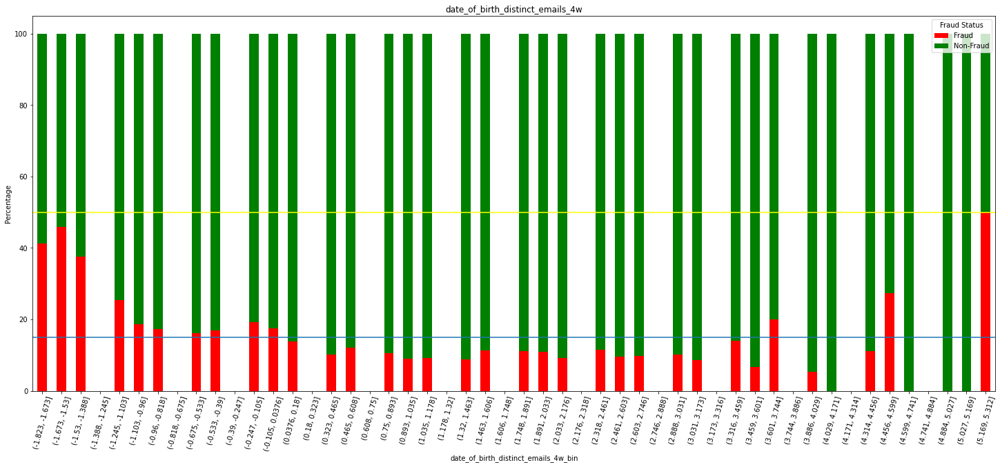

In [19]:
plot_hist_stacked(df_cluster, 'date_of_birth_distinct_emails_4w', 'date_of_birth_distinct_emails_4w')

## label = 1

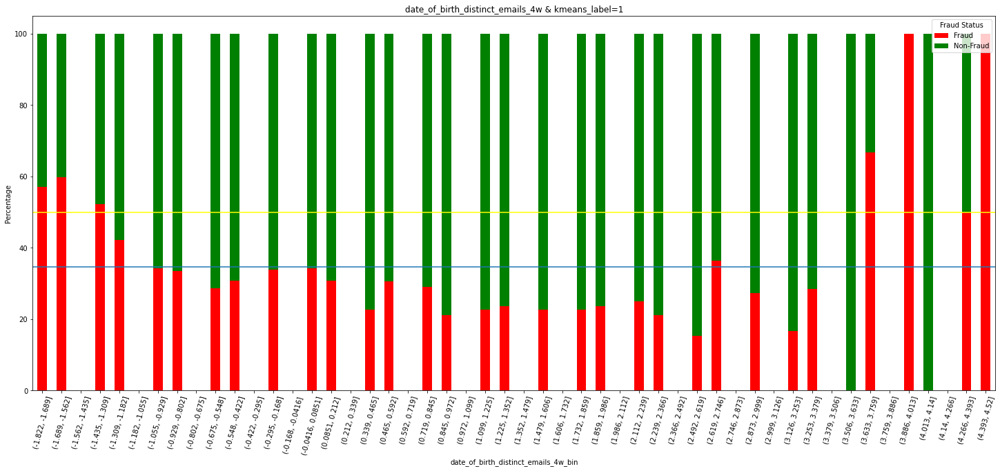

In [20]:
plot_hist_stacked(df_cluster[df_cluster['kmeans_label']==1], 'date_of_birth_distinct_emails_4w', 'date_of_birth_distinct_emails_4w & kmeans_label=1')

### date_of_birth_distinct_emails_4w <=-1.42, label = 1 (54%, 1.4k)

In [21]:
df_cluster[(df_cluster['date_of_birth_distinct_emails_4w']<=-1.23) & (df_cluster['kmeans_label']==1)]['fraud_bool'].value_counts()

1    738
0    610
Name: fraud_bool, dtype: int64

In [22]:
df_cluster[(df_cluster['date_of_birth_distinct_emails_4w']<=-1.23) & (df_cluster['kmeans_label']==1)]['fraud_bool'].value_counts(normalize=True)

1    0.547478
0    0.452522
Name: fraud_bool, dtype: float64

# credit_risk_score

In [23]:
occurrences = df_cluster.groupby(["kmeans_label", 'credit_risk_score', "fraud_bool"]).size().reset_index(name="Occurrences")
occurrences.sort_values("kmeans_label", inplace=True)
fig = px.scatter(occurrences, x='credit_risk_score', y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
fig.show()

## all

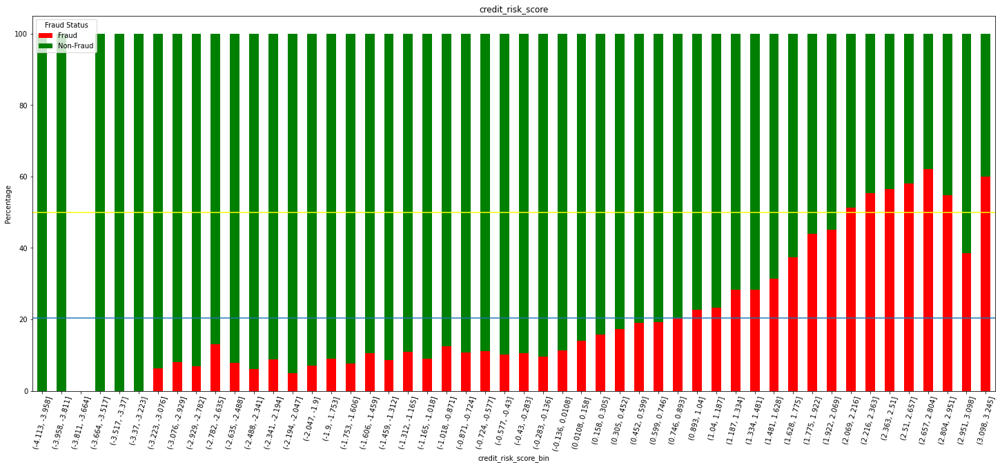

In [24]:
plot_hist_stacked(df_cluster, 'credit_risk_score', 'credit_risk_score')

### credit_risk_score>=2.069 (55%, 1.3k)

In [25]:
df_cluster[(df_cluster['credit_risk_score']>=2.069)]['fraud_bool'].value_counts()

1    724
0    587
Name: fraud_bool, dtype: int64

In [26]:
df_cluster[(df_cluster['credit_risk_score']>=2.069)]['fraud_bool'].value_counts(normalize=True)

1    0.55225
0    0.44775
Name: fraud_bool, dtype: float64

## label = 1

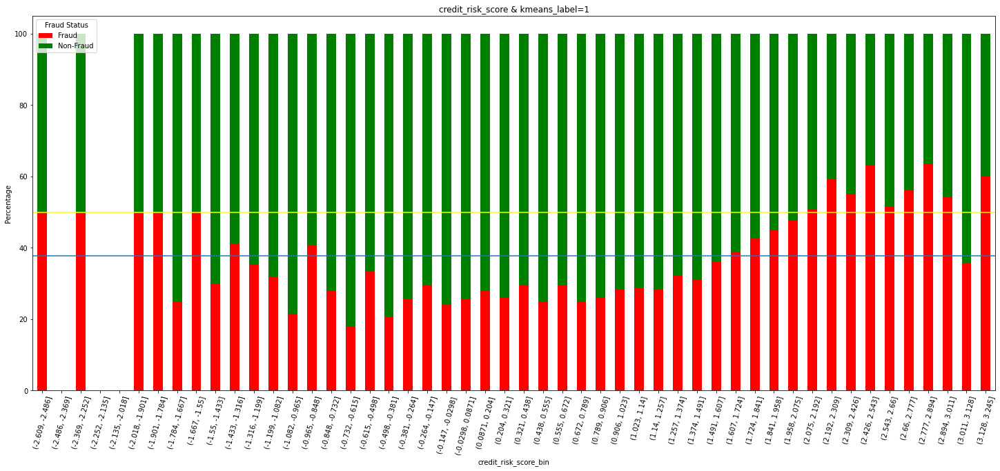

In [27]:
plot_hist_stacked(df_cluster[df_cluster['kmeans_label']==1], 'credit_risk_score', 'credit_risk_score & kmeans_label=1')

### -.155 <= credit_risk_score >=2 (55%, 1.4k)

In [28]:
df_cluster[(df_cluster['credit_risk_score']>=2) & (df_cluster['kmeans_label']==1)]['fraud_bool'].value_counts()

1    764
0    622
Name: fraud_bool, dtype: int64

In [29]:
df_cluster[(df_cluster['credit_risk_score']>=2) & (df_cluster['kmeans_label']==1)]['fraud_bool'].value_counts(normalize=True)

1    0.551227
0    0.448773
Name: fraud_bool, dtype: float64

In [30]:
df_cluster[((df_cluster['credit_risk_score']>=2) | (df_cluster['credit_risk_score']<=-1.55)) & (df_cluster['kmeans_label']==1)]['fraud_bool'].value_counts()

1    770
0    630
Name: fraud_bool, dtype: int64

In [31]:
df_cluster[((df_cluster['credit_risk_score']>=2) | (df_cluster['credit_risk_score']<=-1.55)) & (df_cluster['kmeans_label']==1)]['fraud_bool'].value_counts(normalize=True)

1    0.55
0    0.45
Name: fraud_bool, dtype: float64

# device_os

In [32]:
occurrences = df_cluster.groupby(["kmeans_label", 'device_os', "fraud_bool"]).size().reset_index(name="Occurrences")
occurrences.sort_values("kmeans_label", inplace=True)
fig = px.scatter(occurrences, x='device_os', y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
fig.show()

## device_os = windows, label = 1 (49%, 4.9k)

In [33]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))]['fraud_bool'].value_counts()

0    2478
1    2425
Name: fraud_bool, dtype: int64

In [34]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))]['fraud_bool'].value_counts(normalize=True)

0    0.505405
1    0.494595
Name: fraud_bool, dtype: float64

##  device_os = windows, label = 1

In [35]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

### income > 1 (58%, 2.1k)

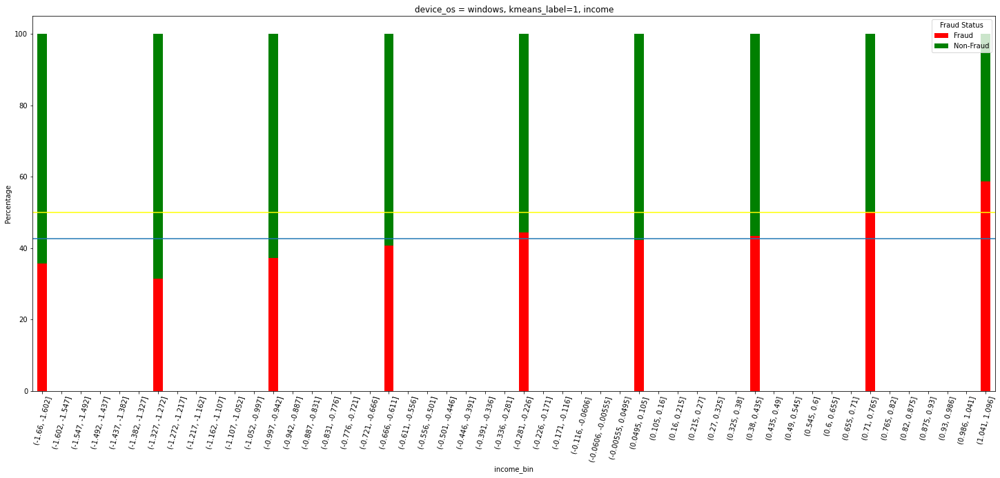

In [36]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'income', 'device_os = windows, kmeans_label=1, income')

In [37]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['income']>1)]['fraud_bool'].value_counts()

1    1221
0     862
Name: fraud_bool, dtype: int64

In [38]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['income']>1)]['fraud_bool'].value_counts(normalize=True)

1    0.586174
0    0.413826
Name: fraud_bool, dtype: float64

### payment type = AC (61%, 1.5k)

In [39]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'payment_type', 'device_os = windows, kmeans_label=1, payment_type')

cannot print stacked bar chart as cannot bin


In [40]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['payment_type'].isin(['AC']))]['fraud_bool'].value_counts()

1    963
0    598
Name: fraud_bool, dtype: int64

In [41]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['payment_type'].isin(['AC']))]['fraud_bool'].value_counts(normalize=True)

1    0.616912
0    0.383088
Name: fraud_bool, dtype: float64

### bank_branch_count_8w < -0.386 (61%, 1.9k)

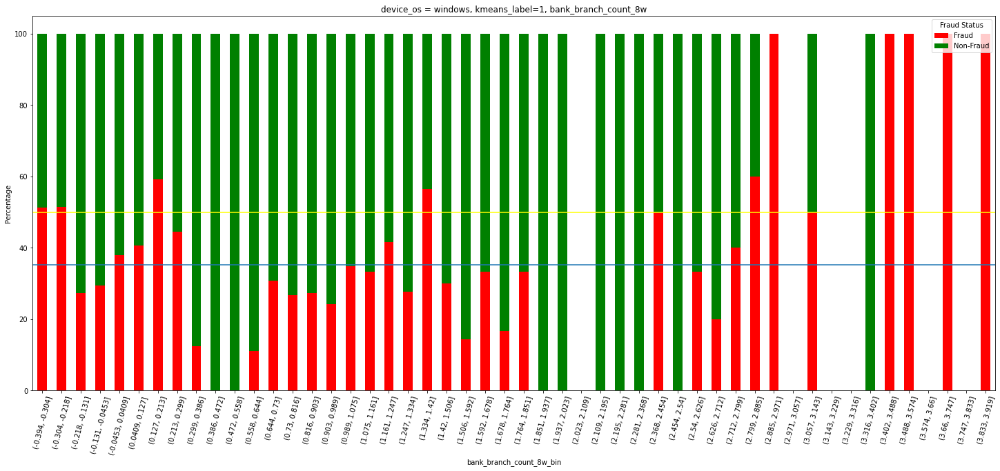

In [42]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'bank_branch_count_8w', 'device_os = windows, kmeans_label=1, bank_branch_count_8w')

In [43]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['bank_branch_count_8w']<-0.386)]['fraud_bool'].value_counts()

1    1162
0     731
Name: fraud_bool, dtype: int64

In [44]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['bank_branch_count_8w']<-0.386)]['fraud_bool'].value_counts(normalize=True)

1    0.61384
0    0.38616
Name: fraud_bool, dtype: float64

### date_of_birth_distinct_emails_4w <= -0.929 (61%, 1.5k)

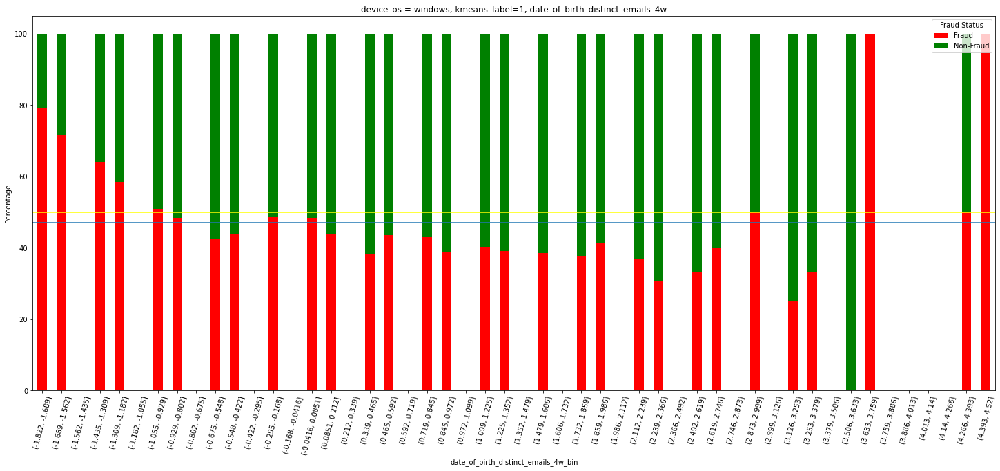

In [45]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'date_of_birth_distinct_emails_4w', 'device_os = windows, kmeans_label=1, date_of_birth_distinct_emails_4w')

In [46]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['date_of_birth_distinct_emails_4w']<=-0.929)]['fraud_bool'].value_counts()

1    929
0    592
Name: fraud_bool, dtype: int64

In [47]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['date_of_birth_distinct_emails_4w']<=-0.929)]['fraud_bool'].value_counts(normalize=True)

1    0.610782
0    0.389218
Name: fraud_bool, dtype: float64

### credit_risk_score >= 1.499 (61%, 1.9k)

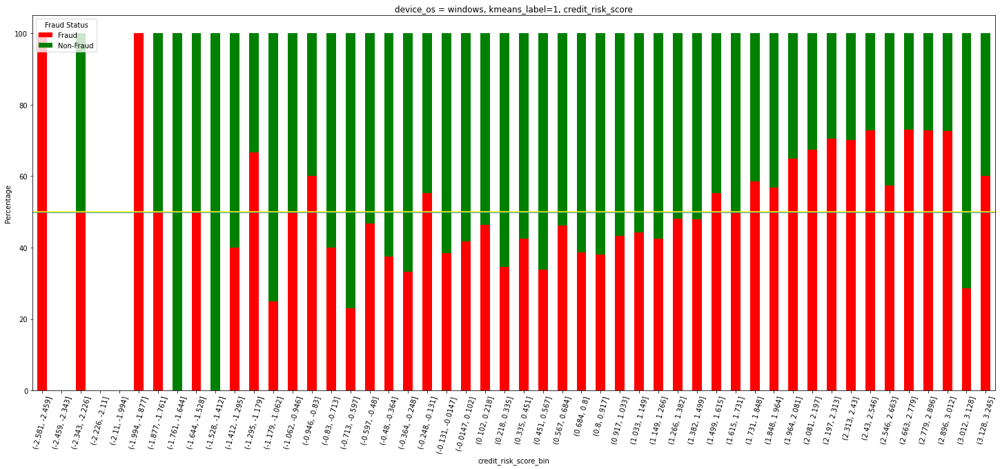

In [48]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'credit_risk_score', 'device_os = windows, kmeans_label=1, credit_risk_score')

In [49]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['credit_risk_score']>=1.49)]['fraud_bool'].value_counts()

1    1148
0     732
Name: fraud_bool, dtype: int64

In [50]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['credit_risk_score']>=1.49)]['fraud_bool'].value_counts(normalize=True)

1    0.610638
0    0.389362
Name: fraud_bool, dtype: float64

### housing status = BA (61%, 3k)

In [51]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'housing_status', 'device_os = windows, kmeans_label=1, housing_status')

cannot print stacked bar chart as cannot bin


In [52]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts()

1    1873
0    1189
Name: fraud_bool, dtype: int64

In [53]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts(normalize=True)

1    0.611692
0    0.388308
Name: fraud_bool, dtype: float64

In [54]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['housing_status']=='BA')]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

#### income >= -0.666 (63%, 2.6k)

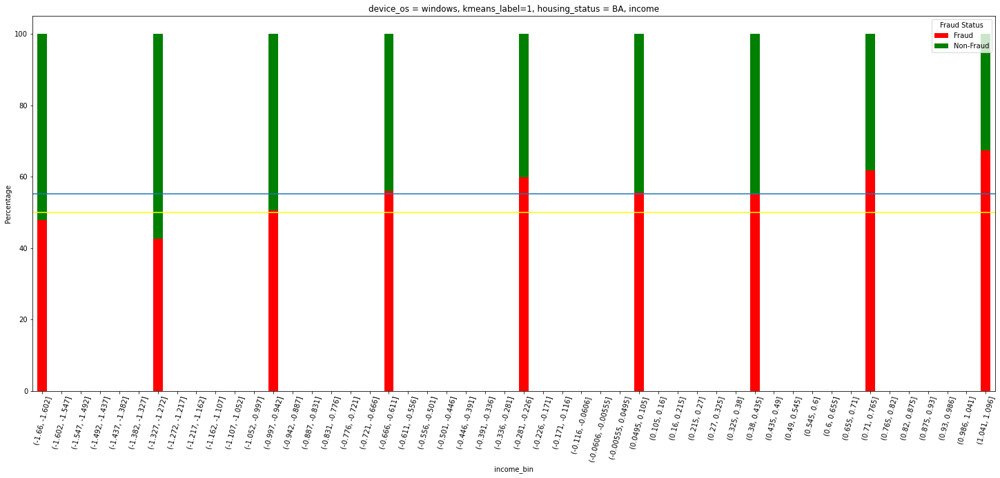

In [55]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') &\
                             (df_cluster['kmeans_label'].isin([1])) &\
                            (df_cluster['housing_status']=='BA')\
                            ], 'income', 'device_os = windows, kmeans_label=1, housing_status = BA, income')

In [56]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['income']>=-0.666)]['fraud_bool'].value_counts()

1    1690
0     984
Name: fraud_bool, dtype: int64

In [57]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['income']>=-0.666)]['fraud_bool'].value_counts(normalize=True)

1    0.632012
0    0.367988
Name: fraud_bool, dtype: float64

### has_other_cards = 0 (65.5%, 2.6k)

In [58]:
df_cluster[(df_cluster['device_os'] == 'windows') & \
           (df_cluster['kmeans_label'].isin([1])) & \
           (df_cluster['housing_status'].isin(['BA'])) &  \
           (df_cluster['has_other_cards'].isin([0]))]['fraud_bool'].value_counts()

1    1720
0     902
Name: fraud_bool, dtype: int64

In [59]:
df_cluster[(df_cluster['device_os'] == 'windows') & \
           (df_cluster['kmeans_label'].isin([1])) & \
           (df_cluster['housing_status'].isin(['BA'])) &  \
           (df_cluster['has_other_cards'].isin([0]))]['fraud_bool'].value_counts(normalize=True)

1    0.655988
0    0.344012
Name: fraud_bool, dtype: float64

### email_is_free = 1 (55%, 2.77k)

In [60]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['email_is_free']==1)]['fraud_bool'].value_counts()

1    1550
0    1252
Name: fraud_bool, dtype: int64

In [61]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['email_is_free']==1)]['fraud_bool'].value_counts(normalize=True)

1    0.553176
0    0.446824
Name: fraud_bool, dtype: float64

### phone_home_valid == 0 (58%, 3k)

In [62]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0)]['fraud_bool'].value_counts()

1    1774
0    1271
Name: fraud_bool, dtype: int64

In [63]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0)]['fraud_bool'].value_counts(normalize=True)

1    0.582594
0    0.417406
Name: fraud_bool, dtype: float64

### bank_months_count < -0.9 (61%, 1.5k)

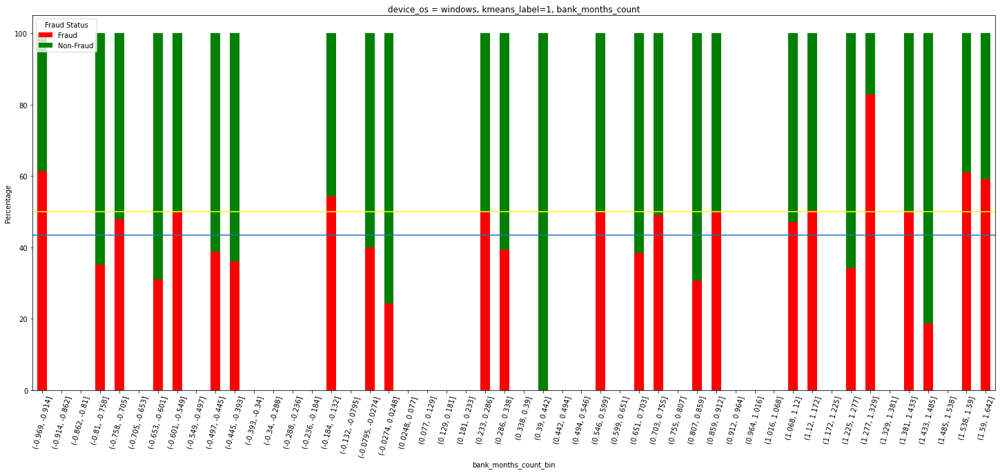

In [64]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'bank_months_count', 'device_os = windows, kmeans_label=1, bank_months_count')

In [65]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['bank_months_count']<-0.9)]['fraud_bool'].value_counts()

1    956
0    599
Name: fraud_bool, dtype: int64

In [66]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['bank_months_count']<-0.9)]['fraud_bool'].value_counts(normalize=True)

1    0.614791
0    0.385209
Name: fraud_bool, dtype: float64

### proposed_credit_limit >= 2.477 (81%, 0.5k)

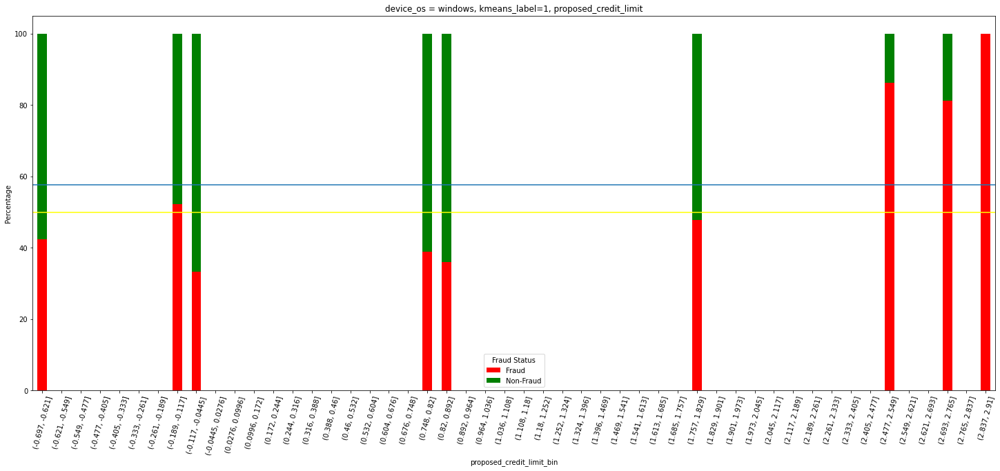

In [67]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'proposed_credit_limit', 'device_os = windows, kmeans_label=1, proposed_credit_limit')

In [68]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['proposed_credit_limit']>=2.477)]['fraud_bool'].value_counts()

1    439
0     98
Name: fraud_bool, dtype: int64

In [69]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['proposed_credit_limit']>=2.477)]['fraud_bool'].value_counts(normalize=True)

1    0.817505
0    0.182495
Name: fraud_bool, dtype: float64

# phone_home_valid = 0, label = 1 (41.9%, 6.3k)

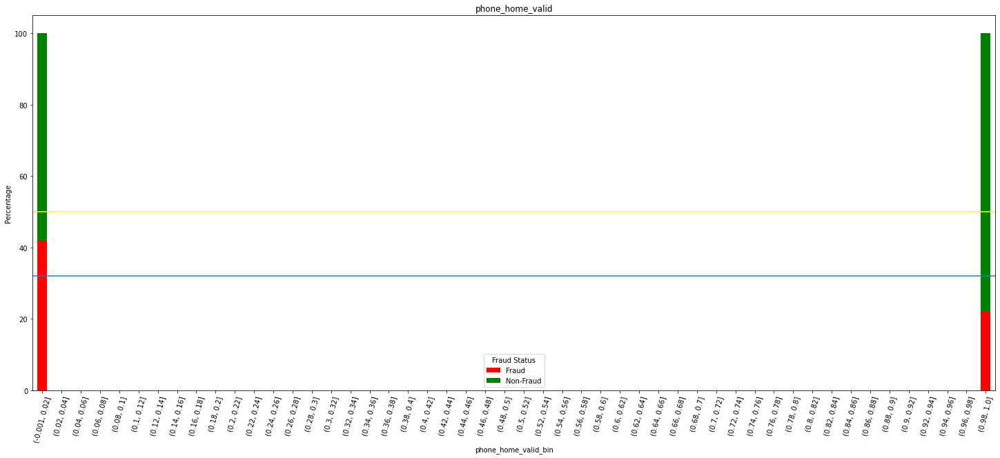

In [70]:
plot_hist_stacked(df_cluster[(df_cluster['kmeans_label'].isin([1]))], 'phone_home_valid', 'phone_home_valid')

In [71]:
df_cluster[(df_cluster['phone_home_valid']==0) & (df_cluster['kmeans_label'].isin([1]))]['fraud_bool'].value_counts()

0    3659
1    2644
Name: fraud_bool, dtype: int64

In [72]:
df_cluster[(df_cluster['phone_home_valid']==0) & (df_cluster['kmeans_label'].isin([1]))]['fraud_bool'].value_counts(normalize=True)

0    0.580517
1    0.419483
Name: fraud_bool, dtype: float64

In [73]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['phone_home_valid']==0) & (df_cluster['kmeans_label'].isin([1]))]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

## date_of_birth_distinct_emails_4w <= -1.182 (63%, 1k)

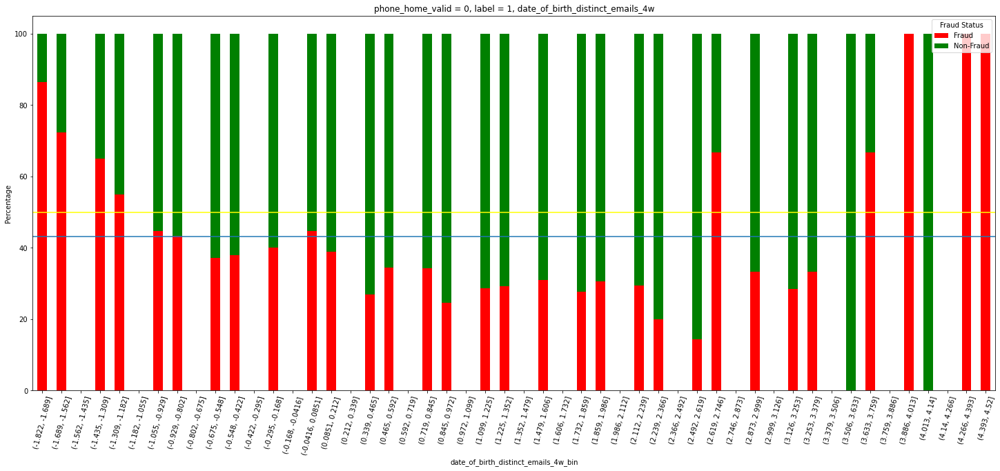

In [74]:
plot_hist_stacked(df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0)], 'date_of_birth_distinct_emails_4w', 'phone_home_valid = 0, label = 1, date_of_birth_distinct_emails_4w')

In [75]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['date_of_birth_distinct_emails_4w']<=-1.182)]['fraud_bool'].value_counts()

1    684
0    397
Name: fraud_bool, dtype: int64

In [76]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['date_of_birth_distinct_emails_4w']<=-1.182)]['fraud_bool'].value_counts(normalize=True)

1    0.632747
0    0.367253
Name: fraud_bool, dtype: float64

## housing_status = BA (56%, 3.6k)

In [77]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts()

1    2025
0    1571
Name: fraud_bool, dtype: int64

In [78]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts(normalize=True)

1    0.563126
0    0.436874
Name: fraud_bool, dtype: float64

## device_0s = 'windows' (58%, 3k)

In [79]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['device_os']=='windows')]['fraud_bool'].value_counts()

1    1774
0    1271
Name: fraud_bool, dtype: int64

In [80]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['device_os']=='windows')]['fraud_bool'].value_counts(normalize=True)

1    0.582594
0    0.417406
Name: fraud_bool, dtype: float64

# has_other_cards = 0, label = 1 (39.8%, 8k)

In [81]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['has_other_cards']==0) & (df_cluster['kmeans_label'].isin([1]))]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

## date_of_birth_distinct_emails_4w <= -1.309 (61.8%, 1.1k)

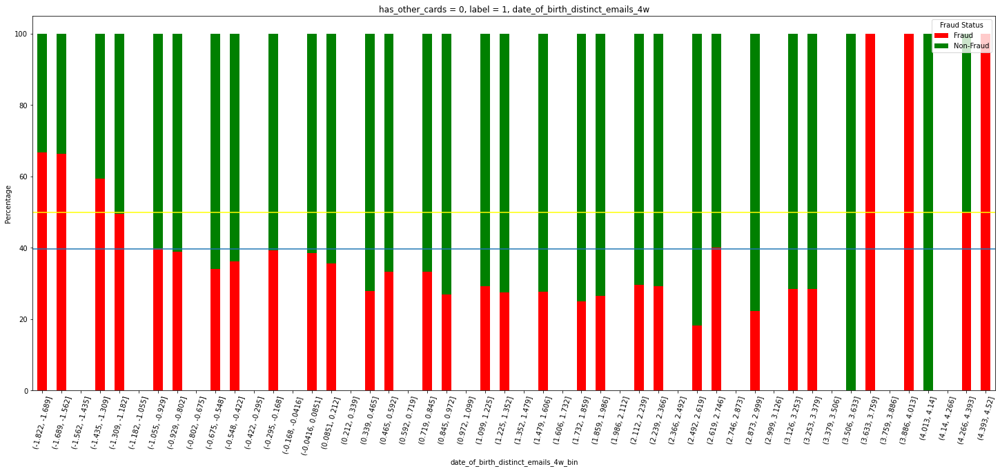

In [82]:
plot_hist_stacked(df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0)], 'date_of_birth_distinct_emails_4w', 'has_other_cards = 0, label = 1, date_of_birth_distinct_emails_4w')

In [83]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0) & (df_cluster['date_of_birth_distinct_emails_4w']<=-1.309)]['fraud_bool'].value_counts()

1    680
0    419
Name: fraud_bool, dtype: int64

In [84]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0) & (df_cluster['date_of_birth_distinct_emails_4w']<=-1.309)]['fraud_bool'].value_counts(normalize=True)

1    0.618744
0    0.381256
Name: fraud_bool, dtype: float64

## credit_risk_score >= 1.8 (59.7%, 1.6k)

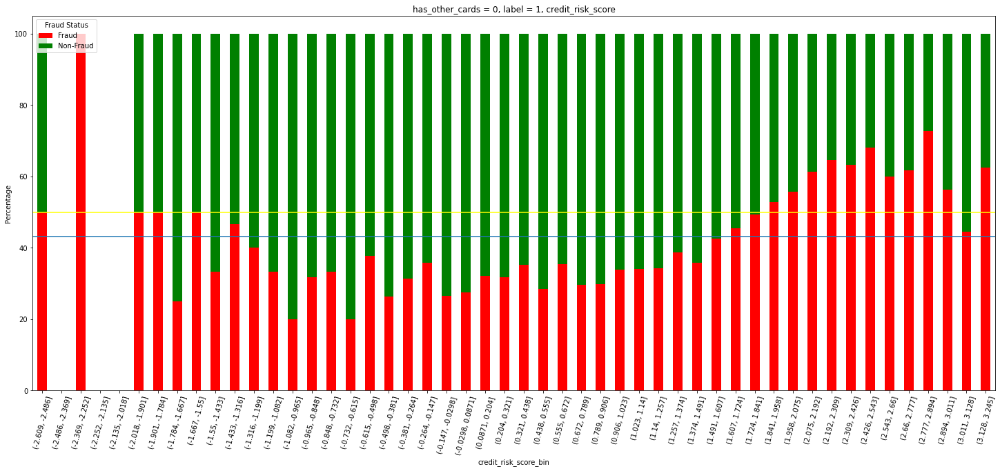

In [85]:
plot_hist_stacked(df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0)], 'credit_risk_score', 'has_other_cards = 0, label = 1, credit_risk_score')

In [86]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0) & (df_cluster['credit_risk_score']>=1.8)]['fraud_bool'].value_counts()

1    965
0    650
Name: fraud_bool, dtype: int64

In [87]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0) & (df_cluster['credit_risk_score']>=1.8)]['fraud_bool'].value_counts(normalize=True)

1    0.597523
0    0.402477
Name: fraud_bool, dtype: float64

# Hypothesis: The higher value of bank integration, the lower chance of fraud - True

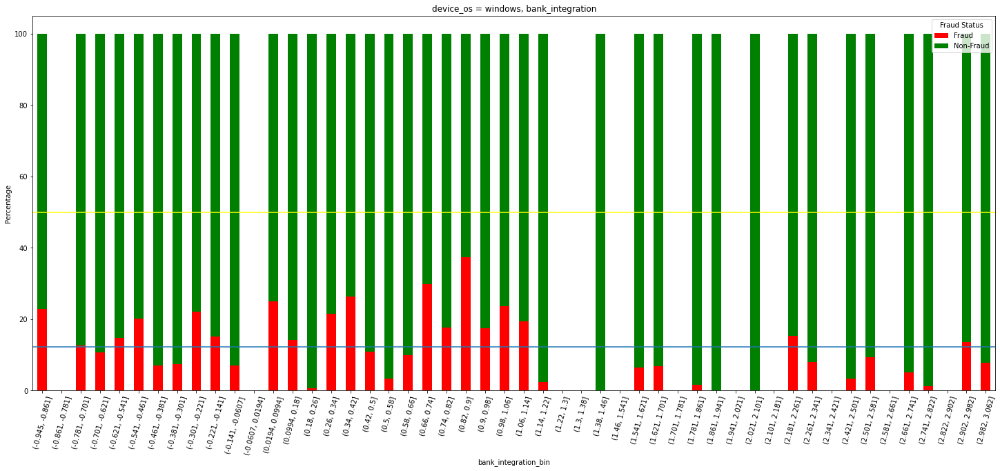

In [91]:
plot_hist_stacked(df_cluster, 'bank_integration', 'device_os = windows, bank_integration')

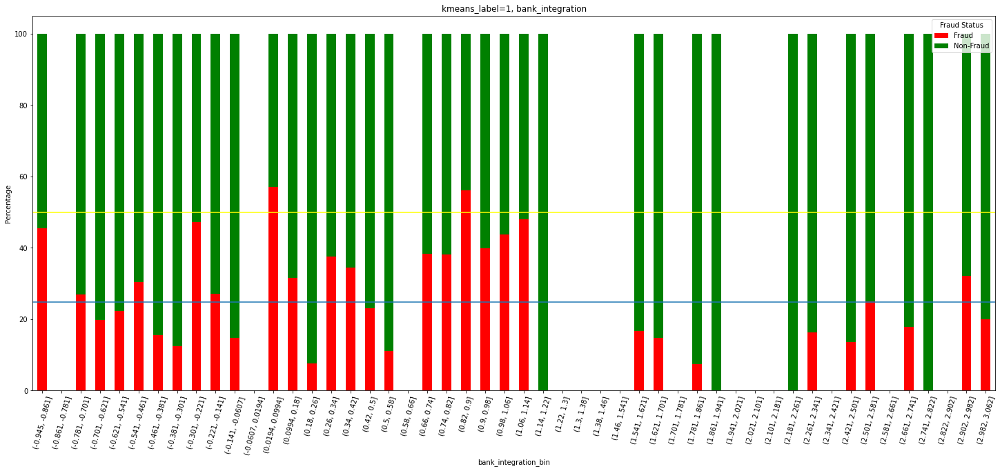

In [92]:
plot_hist_stacked(df_cluster[(df_cluster['kmeans_label'].isin([1]))], 'bank_integration', 'kmeans_label=1, bank_integration')

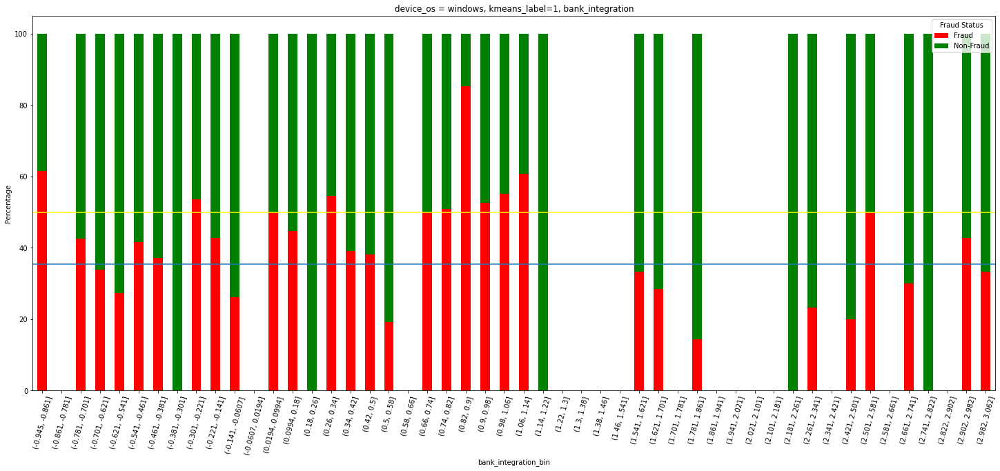

In [90]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'bank_integration', 'device_os = windows, kmeans_label=1, bank_integration')